# 0.a. Import and settings

In [1]:
%load_ext autoreload
%autoreload 2
%load_ext rpy2.ipython

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
import scanpy as sc
from scanpy.plotting._tools.scatterplots import plot_scatter
import scanpy_scripts as ss
import bbknn

expr_cmap = ss.lib.expression_colormap(background_level=0.01)
np.set_printoptions(linewidth=180)
sc.settings.verbosity = 1
sc.settings.figdir = 'png'

# 0.b. Define functions

In [3]:
import warnings
warnings.filterwarnings(action='ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

In [107]:
def diffexp(
    adata, basis='umap', key=None, res=None, method='logreg',
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=None, **kwargs
):
    if key:
        grp_key = f'{key}_r{str(res).replace(".", "_")}'
        basis=f'{basis}_{key}'
    else:
        grp_key = f'r{str(res).replace(".", "_")}'
    de_tbl = ss.lib.diffexp(
        adata, key_added=grp_key, groupby=f'leiden_{grp_key}', method=method,
        filter_params=filter_params, **kwargs,
    )
    de_genes = list(de_tbl.groupby('cluster').head(4)['genes'].values)
    if extra_genes:
        de_genes.extend(extra_genes)
    rcParams.update({'figure.figsize': (4,4)})
    sc.pl.rank_genes_groups(adata, key=f'rank_genes_groups_{grp_key}', show=False)

    sc.pl.dotplot(
        adata,
        var_names=de_genes,
        groupby=f'leiden_{grp_key}',
        #standard_scale='var',
        show=False
    )

    rcParams.update({'figure.figsize':(2.5,2.5)})
    plot_scatter(
        adata, basis=basis, color_map=expr_cmap, use_raw=True, ncols=8, size=10, color=de_genes, show=False)
    rcParams.update({'figure.figsize':(3,3)})
    ss.lib.plot_embedding(adata, basis=basis, groupby=f'leiden_{grp_key}', size=20, show=False)
    return de_tbl

# 1. Load data

In [4]:
CATEGORY_NAME = 'myeloid-cells'
CATEGORY_CLUSTER_ID = 1
MIN_BATCH_SIZE = 10
DE_METHOD = 't-test_overestim_var'
DE_FILTERS = {'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 1.5}
KNOWN_MARKERS = ['CD14', 'CD28', 'CD52', 'C3', 'ACTA1']

In [6]:
# 1. Load data
fetal_ad = sc.read('data/h5ad/fetal_skin_raw.20190926.h5ad', mode='r')

# Restrict to category of interest
ad = fetal_ad[(fetal_ad.obs['hierarchy1'] == CATEGORY_CLUSTER_ID), :]

# Remove samples with too few cells
sample_sizes = ad.obs['sample'].value_counts()
valid_batches = sample_sizes[sample_sizes >= MIN_BATCH_SIZE].index.to_list()
ad = ad[ad.obs['sample'].isin(valid_batches), :]

ad.write(f'data/h5ad/fetal_skin_hierarch1_{CATEGORY_NAME}.h5ad', compression='gzip')

In [5]:
ad = sc.read(f'data/h5ad/fetal_skin_hierarch1_{CATEGORY_NAME}.h5ad')

In [7]:
ad

AnnData object with n_obs × n_vars = 44426 × 33694 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'hierarchy1'
    var: 'gene_ids', 'cc'

# 2. QC

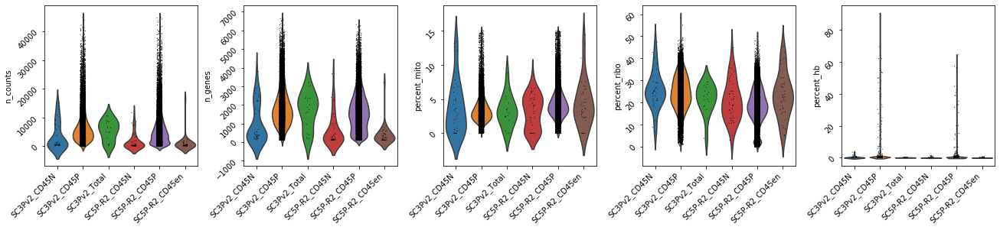

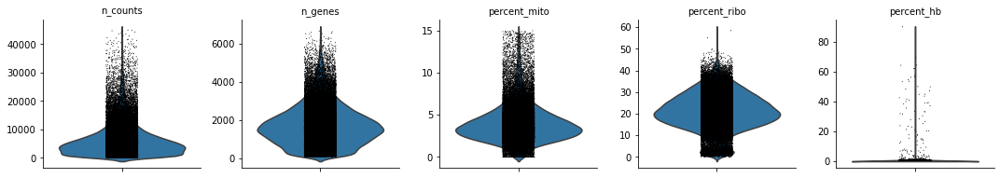

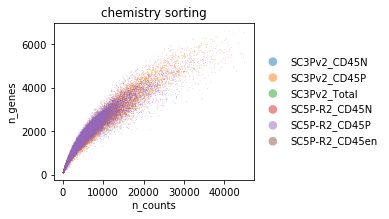

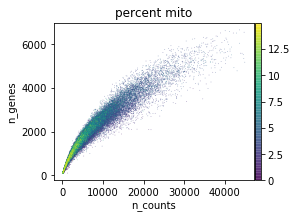

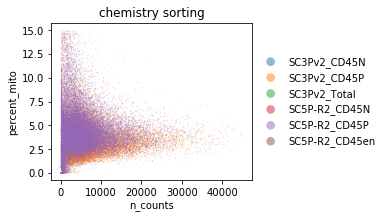

...

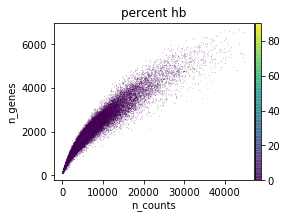

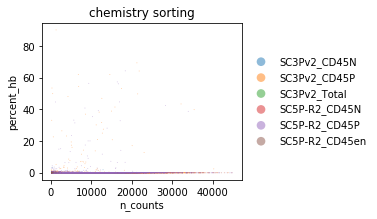

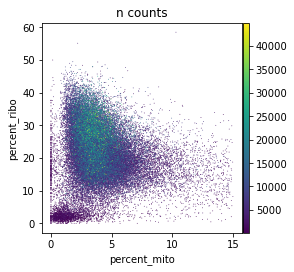

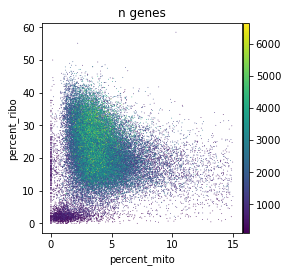

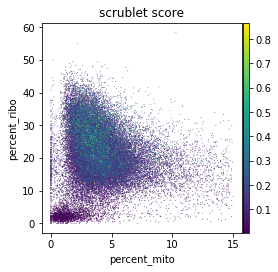

In [7]:
ss.lib.set_figsize((4,4))
ss.lib.simple_default_pipeline(ad, qc_only=True, batch='chemistry_sorting')
sc.pl.scatter(ad, x='percent_mito', y='percent_ribo', color='n_counts')
sc.pl.scatter(ad, x='percent_mito', y='percent_ribo', color='n_genes')
sc.pl.scatter(ad, x='percent_mito', y='percent_ribo', color='scrublet_score')

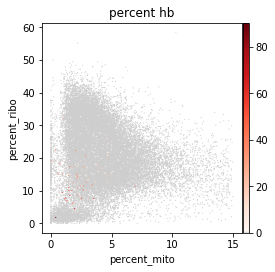

In [18]:
sc.pl.scatter(ad, x='percent_mito', y='percent_ribo', color='percent_hb', color_map=expr_cmap, size=5)

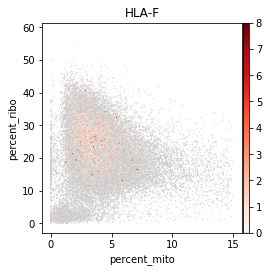

In [19]:
sc.pl.scatter(ad, x='percent_mito', y='percent_ribo', color='HLA-F', color_map=expr_cmap, size=5)

In [23]:
ad.obs['qc_cluster'] = (ad.obs.percent_mito < 5) & (ad.obs.percent_ribo < 6)
ad.obs['qc_cluster'] = ad.obs['qc_cluster'].astype(str).astype('category')

In [24]:
qc_de_genes = ss.lib.diffexp(ad, use_raw=False, key_added='qc', groupby='qc_cluster',
               filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 1.5})

In [26]:
qc_de_genes.groupby('cluster').head(10)

,cluster,ref,rank,genes,scores,logfoldchanges,pvals,pvals_adj
2,False,rest,2,RPL36,211.644073,32.657997,0.000000e+00,0.000000e+00
19,False,rest,19,RPL22,190.931961,19.482199,0.000000e+00,0.000000e+00
26,False,rest,26,RPL38,188.049469,17.768864,0.000000e+00,0.000000e+00
34,False,rest,34,TOMM7,184.778839,7.316629,0.000000e+00,0.000000e+00
35,False,rest,35,RPL35,184.482361,25.811691,0.000000e+00,0.000000e+00
41,False,rest,41,ATP5I,182.128845,7.260140,0.000000e+00,0.000000e+00
49,False,rest,49,RPS21,179.763626,25.526257,0.000000e+00,0.000000e+00
51,False,rest,51,GPX4,178.932831,7.951063,0.000000e+00,0.000000e+00
54,False,rest,54,NPC2,177.494949,10.831753,0.000000e+00,0.000000e+00
55,False,rest,55,COX7C,177.455185,10.666609,0.000000e+00,0.000000e+00


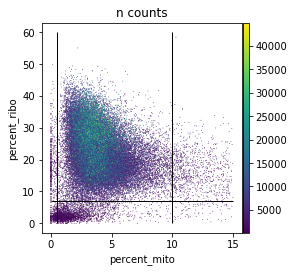

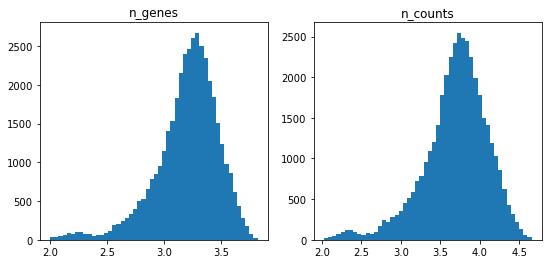

In [8]:
ss.lib.set_figsize((4,4))
ax = sc.pl.scatter(ad, x='percent_mito', y='percent_ribo', color='n_counts', show=False)
ax.vlines(x=[0.5, 10], ymin=0, ymax=60, linewidth=1)
ax.hlines(y=7, xmin=0, xmax=15, linewidth=1)
ss.lib.set_figsize((9,4))
fig, ax = plt.subplots(ncols=2)
_ = ax[0].hist(np.log10(ad.obs.loc[(ad.obs['percent_mito']>0.5) & (ad.obs['percent_mito']<10) & (ad.obs['percent_ribo']>7), 'n_genes']), bins=50)
ax[0].set_title('n_genes')
_ = ax[1].hist(np.log10(ad.obs.loc[(ad.obs['percent_mito']>0.5) & (ad.obs['percent_mito']<10) & (ad.obs['percent_ribo']>7), 'n_counts']), bins=50)
ax[1].set_title('n_counts')
ss.lib.set_figsize((4,4))

# 3. Default preprocessing

In [9]:
MIN_PCT_MITO = 0.5
MAX_PCT_MITO = 10
MIN_PCT_RIBO = 7
MIN_N_GENE = 300
MIN_N_UMI = 500
MAX_PCT_HB = 2.5
MIN_N_CELL = 3
CLUSTER_RESOLUTIONS = [0.1, 0.2, 0.3, 0.4, 0.5]

In [10]:
ad = ad[
    (ad.obs.percent_mito >= MIN_PCT_MITO) &
    (ad.obs.percent_mito < MAX_PCT_MITO) &
    (ad.obs.percent_ribo >= MIN_PCT_RIBO) &
    (ad.obs.n_genes >= MIN_N_GENE) &
    (ad.obs.n_counts >= MIN_N_UMI) &
    (ad.obs.percent_hb < MAX_PCT_HB), :]
ad = ad[:, (ad.var.n_cells >= MIN_N_CELL)]

In [12]:
ad1 = ad.copy()[:, ~(ad.var.mito | ad.var.hb | ad.var.ribo)]

ss.lib.simple_default_pipeline(
    ad1,
    filter_params=None,
    hvg_params={'flavor': 'seurat', 'by_batch': ['chemistry', 2]},
    scale_params={'max_value': 10},
    pca_params={'n_comps': 50, 'svd_solver': 'arpack', 'use_highly_variable': True},
    harmony_params=None,
    nb_params={'use_rep': 'X_pca', 'key_added': 'orig'},
    umap_params={'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    leiden_params={'resolution': CLUSTER_RESOLUTIONS, 'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

k_annot = (ad1.obs['annot'] != 'nan').values
ad1.obs['lr_annot'] = ss.lib.LR_annotate(
    ad1, train_label=ad1.obs['annot'].values, train_x=ad1.obsm['X_pca'], subset=k_annot, use_rep='X_pca', return_label=True)
ad1.obs['lr_annot'] = ad1.obs['lr_annot'].astype('category')

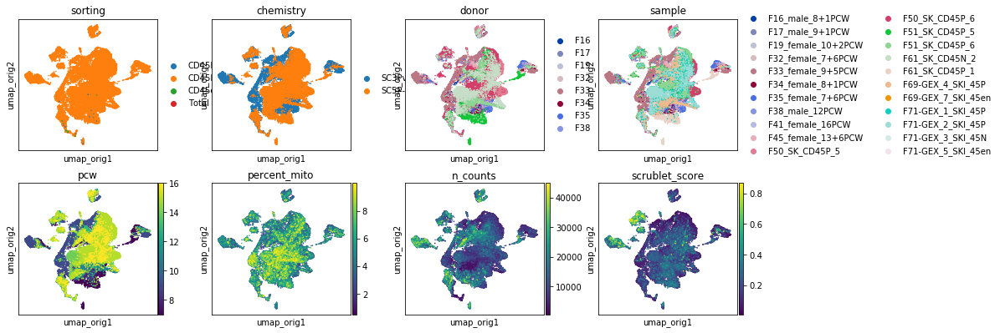

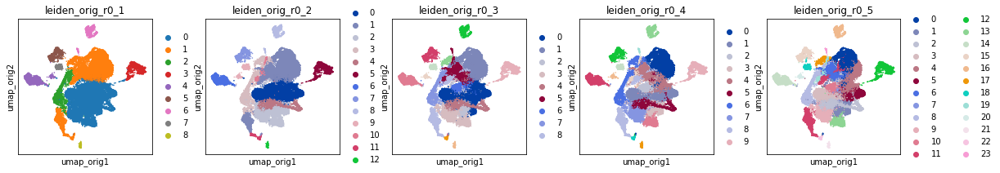

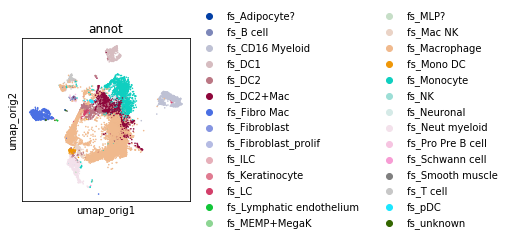

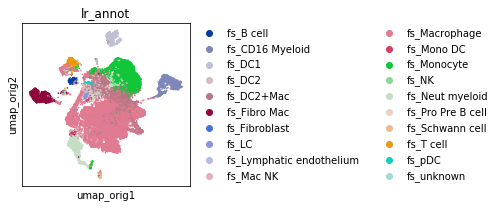

                      freq         p
leiden_orig_r0_3                    
0                 0.004743  0.750000
1                 0.015181  0.231522
2                 0.002876  0.750000
3                 0.001176  0.750000
4                 0.000000  0.750000
5                 0.007210  0.750000
6                 0.015619  0.231522
7                 0.000448  0.750000
8                 0.000000  0.750000
9                 0.020503  0.073210
10                0.387931  0.000000
11                0.669363  0.000000
12                0.005420  0.750000
13                0.000000  0.750000
14                0.604839  0.000000
15                0.077419  0.000000
16                0.000000  0.750000
17                0.000000  0.750000
                     score             p
leiden_orig_r0_3                        
0                 0.121107  8.711272e-01
1                 0.085663  8.711272e-01
2                 0.115451  8.711272e-01
3                 0.149229  7.736967e-01
4             

In [34]:
ad1.obs['doublet'] = ad1.obs['bh_doublet_pval'] < 0.05
ad1.obs['doublet'] = ad1.obs['doublet'].astype('category')
ss.lib.set_figsize((3,3))
plot_scatter(
    ad1, basis='umap_orig', size=10,
    color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'])
plot_scatter(
    ad1, basis='umap_orig', size=10, ncols=len(CLUSTER_RESOLUTIONS),
    color=[f'leiden_orig_r{str(res).replace(".", "_")}' for res in CLUSTER_RESOLUTIONS])
plot_scatter(
    ad1[k_annot, :], basis='umap_orig', size=10,
    color='annot')
plot_scatter(
    ad1, basis='umap_orig', size=10,
    color='lr_annot')

doublet_freq = ad1.obs.groupby('leiden_orig_r0_3')['doublet'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

doublet_freq = ad1.obs.groupby('leiden_orig_r0_3')['scrublet_score'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

In [35]:
ad2 = ad.copy()[:,~(ad.var.mito | ad.var.hb | ad.var.ribo | ad.var.cc)]

ss.lib.simple_default_pipeline(
    ad2,
    filter_params=None,
    hvg_params={'flavor': 'seurat', 'by_batch': ['chemistry', 2]},
    scale_params={'max_value': 10},
    pca_params={'n_comps': 50, 'svd_solver': 'arpack', 'use_highly_variable': True},
    harmony_params=None,
    nb_params={'use_rep': 'X_pca', 'key_added': 'orig'},
    umap_params={'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    leiden_params={'resolution': CLUSTER_RESOLUTIONS, 'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

k_annot = (ad2.obs['annot'] != 'nan').values
ad2.obs['lr_annot'] = ss.lib.LR_annotate(
    ad2, train_label=ad2.obs['annot'].values, train_x=ad2.obsm['X_pca'], subset=k_annot, use_rep='X_pca', return_label=True)
ad2.obs['lr_annot'] = ad2.obs['lr_annot'].astype('category')

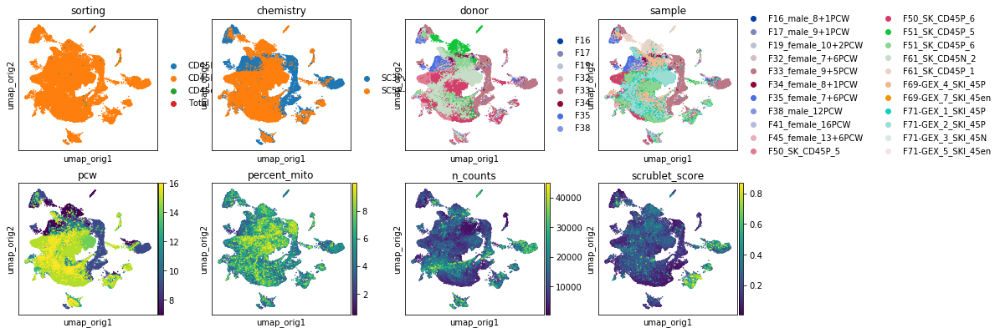

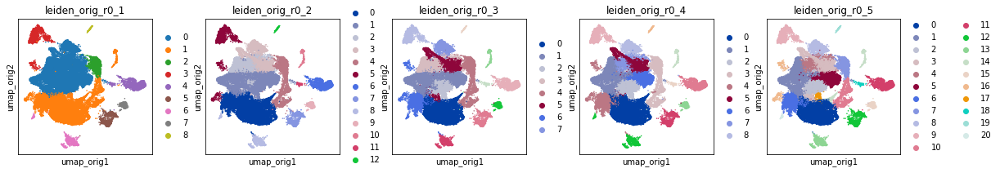

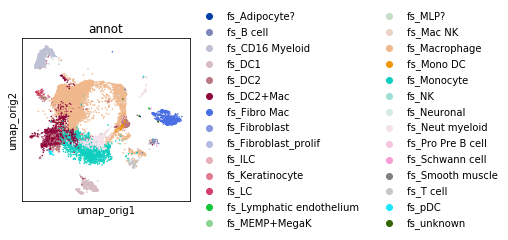

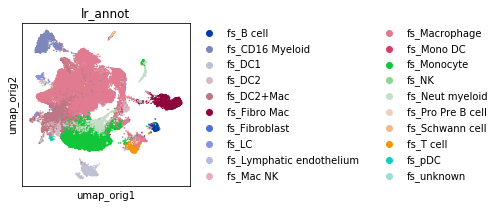

                      freq             p
leiden_orig_r0_3                        
0                 0.013212  5.695388e-01
1                 0.005369  7.500003e-01
2                 0.008891  7.500003e-01
3                 0.002936  7.500003e-01
4                 0.000956  7.500003e-01
5                 0.000330  7.500003e-01
6                 0.006664  7.500003e-01
7                 0.000000  7.500003e-01
8                 0.020422  1.769868e-01
9                 0.386417  0.000000e+00
10                0.665306  0.000000e+00
11                0.005472  7.500003e-01
12                0.613158  0.000000e+00
13                0.000000  7.500003e-01
14                0.076433  1.065814e-14
15                0.000000  7.500003e-01
                     score         p
leiden_orig_r0_3                    
0                 0.091134  0.794250
1                 0.120987  0.794250
2                 0.091337  0.794250
3                 0.130698  0.794250
4                 0.073667  0.794250
5  

In [36]:
ad2.obs['doublet'] = ad2.obs['bh_doublet_pval'] < 0.05
ad2.obs['doublet'] = ad2.obs['doublet'].astype('category')

ss.lib.set_figsize((3,3))
plot_scatter(
    ad2, basis='umap_orig', size=10,
    color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'])
plot_scatter(
    ad2, basis='umap_orig', size=10, ncols=len(CLUSTER_RESOLUTIONS),
    color=[f'leiden_orig_r{str(res).replace(".", "_")}' for res in CLUSTER_RESOLUTIONS])
plot_scatter(ad2[k_annot, :], basis='umap_orig', size=10, color='annot')
plot_scatter(ad2, basis='umap_orig', size=10, color='lr_annot')


doublet_freq = ad2.obs.groupby('leiden_orig_r0_3')['doublet'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

doublet_freq = ad2.obs.groupby('leiden_orig_r0_3')['scrublet_score'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

# 4.1 Harmony

In [14]:
ss.lib.simple_default_pipeline(
    ad1,
    filter_params=None, norm_params=None, hvg_params=None, scale_params=None, pca_params=None,
    harmony_params={'batch': 'sample', 'key_added': 'hm'},
    nb_params={'use_rep': 'X_pca_hm', 'key_added': 'hm'},
    umap_params={'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    leiden_params={'resolution': CLUSTER_RESOLUTIONS, 'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

AnnData object with n_obs × n_vars = 39028 × 24009 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'leiden_orig_r0_5', 'lr_annot', 'doublet', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'leiden_orig_r0_5_colors', 'lr_annot_colors', 'neighbors_hm', 'neighbors'
    obsm: 'X_pca', 'X_umap_orig', 'X_pca_hm', 'X_umap_hm'
   

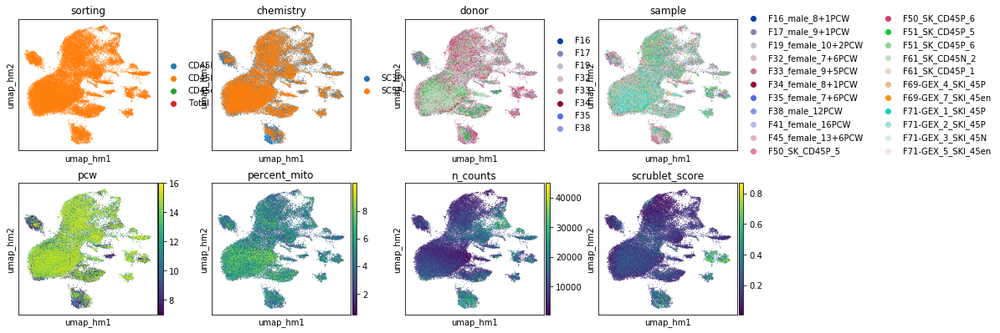

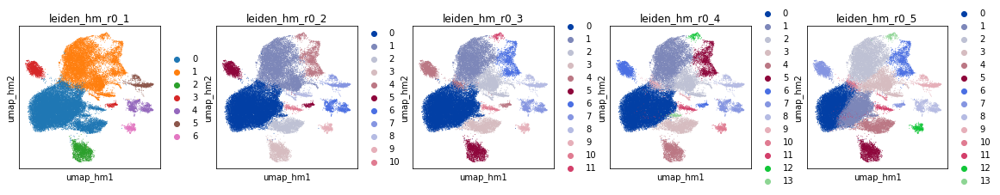

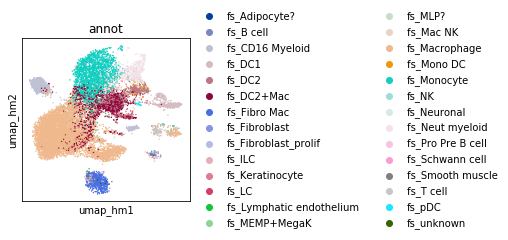

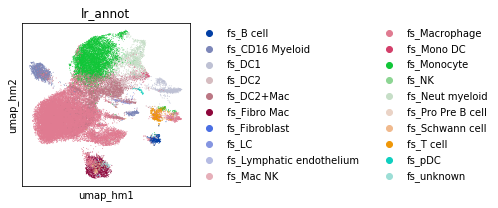

                    freq         p
leiden_hm_r0_3                    
0               0.002323  0.750000
1               0.018174  0.248631
2               0.006528  0.750000
3               0.005935  0.750000
4               0.017885  0.248631
5               0.288232  0.000000
6               0.000000  0.750000
7               0.652778  0.000000
8               0.005284  0.750000
9               0.580311  0.000000
10              0.003289  0.750000
11              0.000000  0.750000
                   score             p
leiden_hm_r0_3                        
0               0.115733  8.350753e-01
1               0.089457  9.240678e-01
2               0.120812  8.350753e-01
3               0.129528  8.350753e-01
4               0.100262  8.950350e-01
5               0.235115  2.255744e-04
6               0.119160  8.350753e-01
7               0.428133  0.000000e+00
8               0.106712  8.950350e-01
9               0.286173  7.480695e-08
10              0.140483  7.376935e-01
11 

In [39]:
ss.lib.set_figsize((3,3))
plot_scatter(
    ad1, basis='umap_hm',
    color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'])
plot_scatter(
    ad1, basis='umap_hm', ncols=len(CLUSTER_RESOLUTIONS),
    color=[f'leiden_hm_r{str(res).replace(".", "_")}' for res in CLUSTER_RESOLUTIONS])
plot_scatter(ad1[k_annot, :], basis='umap_hm', color='annot')
plot_scatter(ad1, basis='umap_hm', color='lr_annot')


doublet_freq = ad1.obs.groupby('leiden_hm_r0_3')['doublet'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

doublet_freq = ad1.obs.groupby('leiden_hm_r0_3')['scrublet_score'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

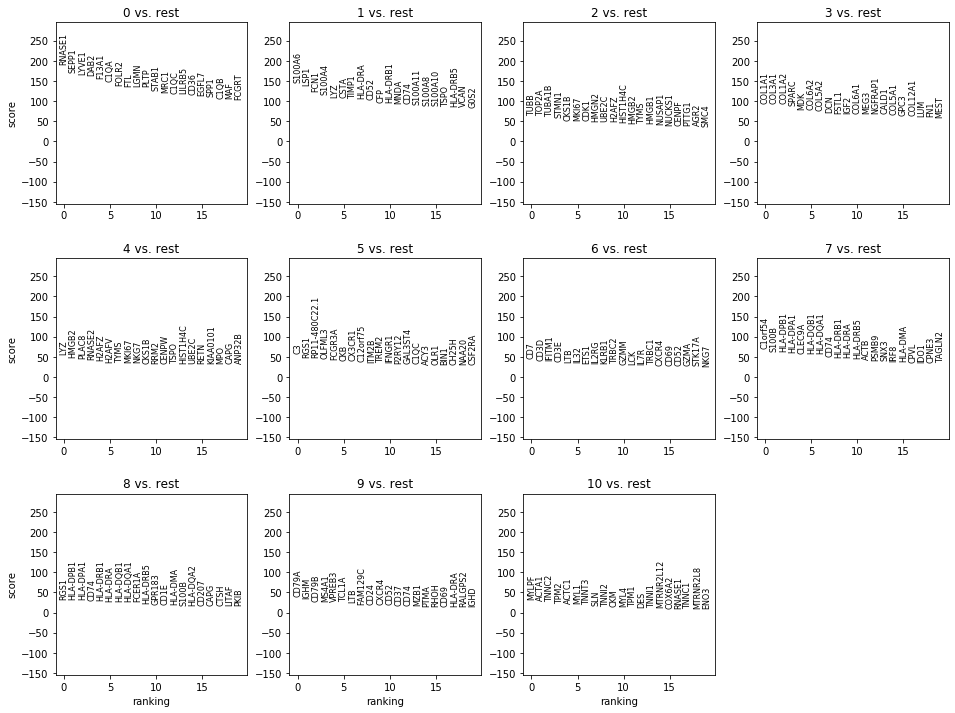

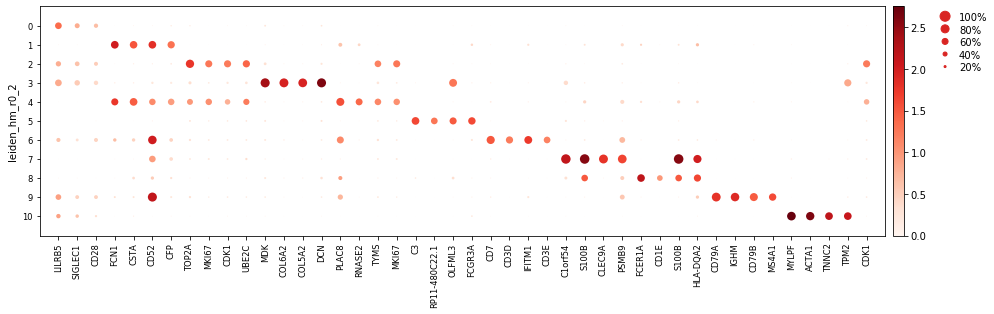

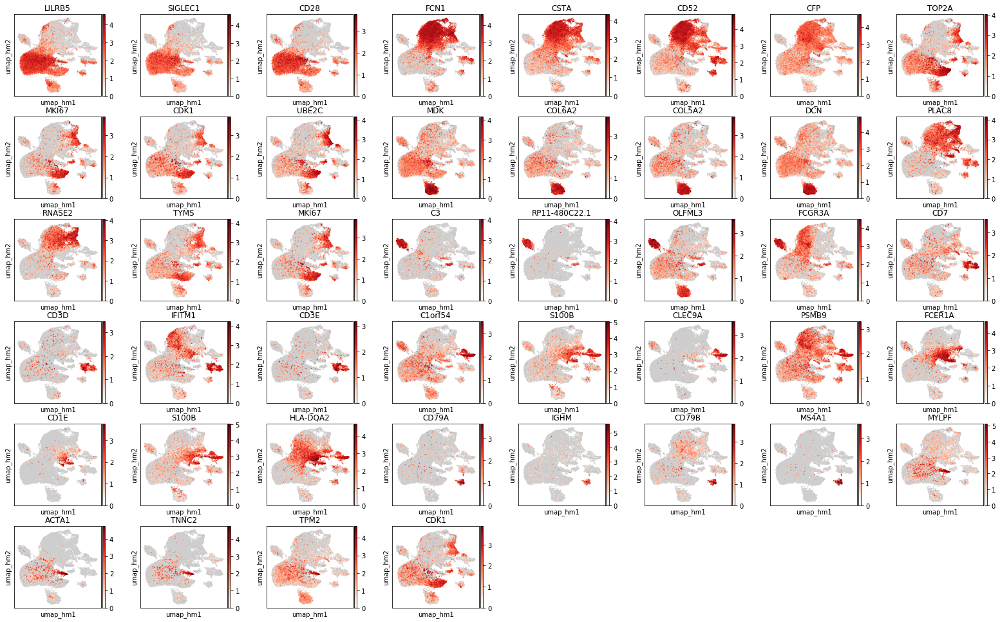

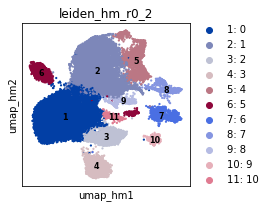

In [42]:
DE_RES = 0.2

hm_de_genes1 = diffexp(
    ad1, basis='umap', key='hm', res=DE_RES, method=DE_METHOD,
    filter_params=DE_FILTERS,
    extra_genes=KNOWN_MARKERS + ['CDK1']
)
hm_de_genes1.groupby('cluster').head(5)

res = str(DE_RES).replace(".", "_")
hm_de_genes1.groupby('cluster').head(30).to_csv(
    f'2.{CATEGORY_CLUSTER_ID+1}_{CATEGORY_NAME}_harmony_withCC_leiden_r{res}_DE_filtered_top30.txt', sep='\t', index=False)
ss.lib.extract_de_table(ad1.uns[f'rank_genes_groups_hm_r{res}']).groupby('cluster').head(200).to_csv(
    f'2.{CATEGORY_CLUSTER_ID+1}_{CATEGORY_NAME}_harmony_withCC_leiden_r{res}_DE_top200.txt', sep='\t', index=False)

In [22]:
rachel_markers = [
    'F13A1', 'C1QA', 'RNASE1', 'CD14', 'S100A9', 'CSF3R', 'FCN1', 'AZU1',
    'MPO', 'RNASE2', 'PLAC8', 'C3', 'FCGR3A', 'CX3CR1', 'OLR1', 'NDRG2',
    'CD207', 'CD1E', 'FCER1A', 'HLA-DQB1', 'CLEC10A', 'CD1C', 'CLEC9A', 'IDO1',
    'C1orf54', 'IL3RA', 'CLEC4C', 'TCF4', 'PCOLCE', 'MEG3', 'COL6A2', 'CD79A',
    'MS4A1', 'IGHM', 'IL7R', 'CD3E', 'KLRD1', 'KLRB1', 'GZMA', 'ACTA1',
    'TNNC2', 'MYLPF', 'DES', 'MKI67', 'CDK1'
]

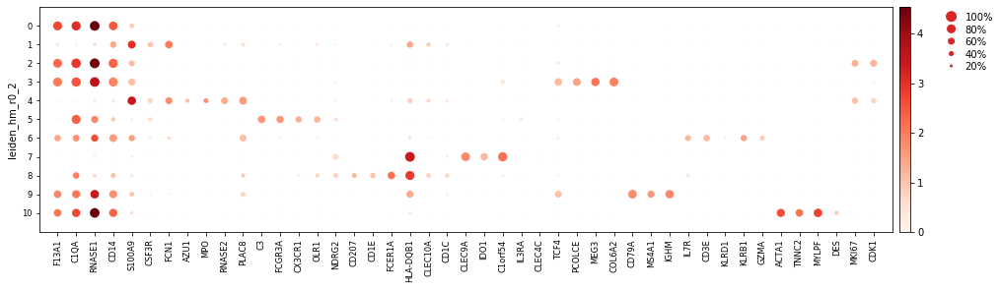

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[15.749999999999998, 0, 0.2, 0.5, 0.25])

In [23]:
sc.pl.dotplot(
    ad1,
    var_names=rachel_markers,
    groupby=f'leiden_hm_r0_2',
    #standard_scale='var',
)

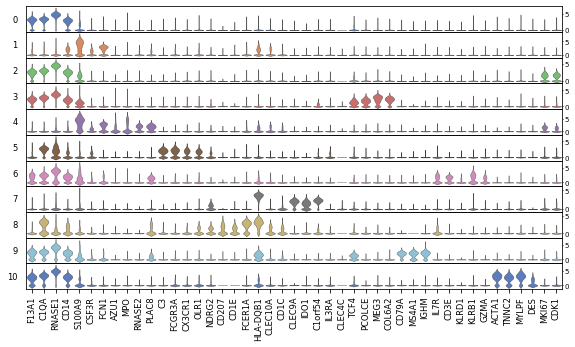

In [54]:
sc.pl.stacked_violin(
    ad1,
    var_names=rachel_markers,
    groupby=f'leiden_hm_r0_2',
    #standard_scale='var',
)

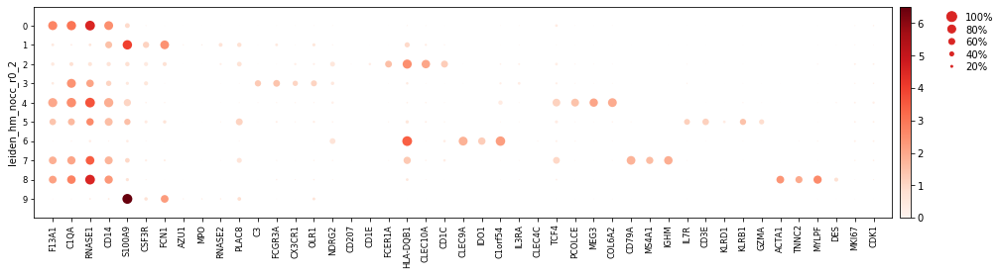

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[15.749999999999998, 0, 0.2, 0.5, 0.25])

In [56]:
sc.pl.dotplot(
    ad1,
    var_names=rachel_markers,
    groupby=f'leiden_hm_nocc_r0_2',
    #standard_scale='var',
)

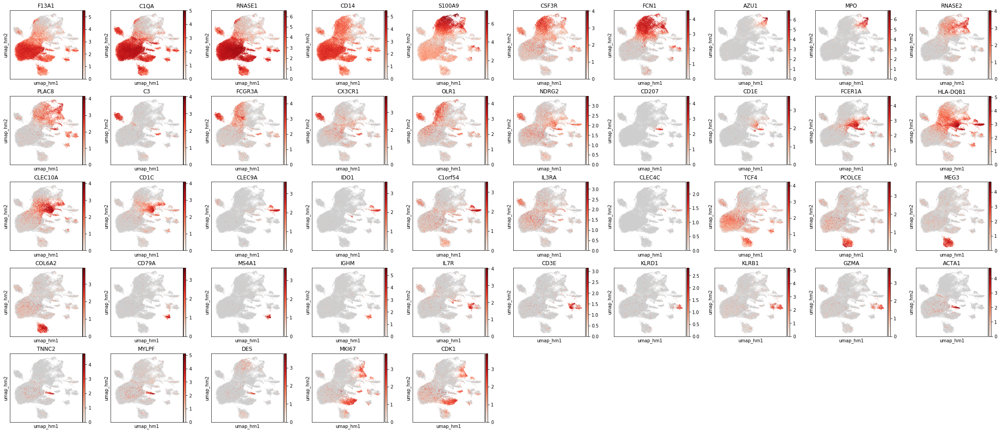

In [30]:
ss.lib.set_figsize((3,3))
plot_scatter(ad1, basis='umap_hm', color_map=expr_cmap, use_raw=True, ncols=10, color=rachel_markers)

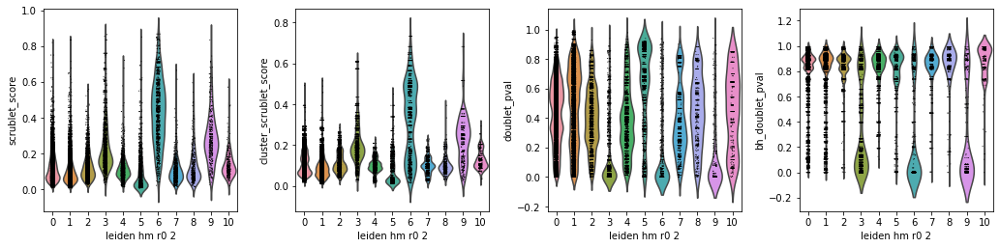

In [98]:
sc.pl.violin(ad1, keys=['scrublet_score', 'cluster_scrublet_score', 'doublet_pval', 'bh_doublet_pval'], groupby='leiden_hm_r0_2')

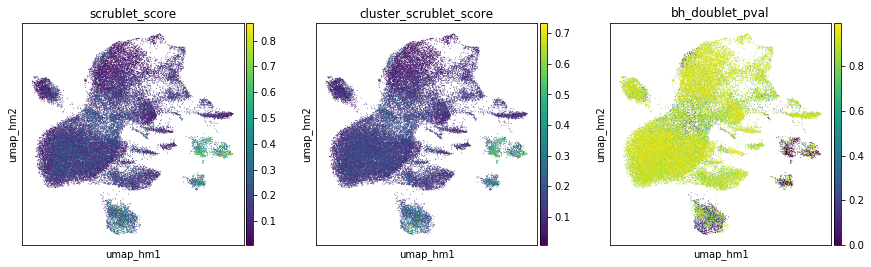

In [18]:
ss.lib.set_figsize((4,4))
plot_scatter(ad1, basis='umap_hm', color=['scrublet_score', 'cluster_scrublet_score', 'bh_doublet_pval'])

In [19]:
ad1.obs.donor[ad1.obs['leiden_hm_r0_2']=='10'].value_counts()

F69    127
F71     90
F41     26
F51     13
F35      9
F16      8
F61      7
F50      6
F45      4
F38      4
F33      3
F34      2
F32      1
F19      0
F17      0
Name: donor, dtype: int64

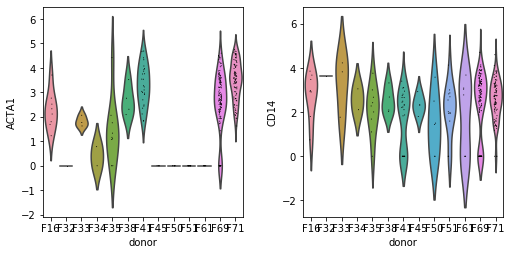

In [51]:
ss.lib.set_figsize((4,4))
sc.pl.violin(ad1[ad1.obs['leiden_hm_r0_2']=='10',:], keys=['ACTA1', 'CD14'], groupby='donor', use_raw=True)

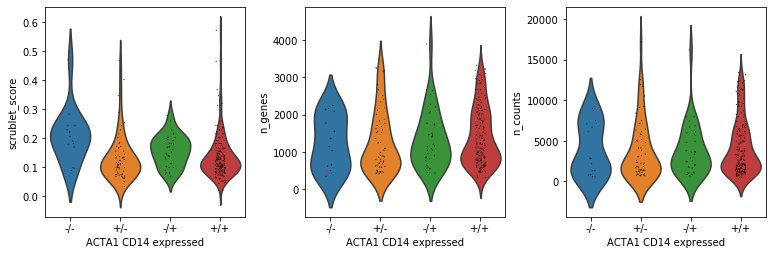

In [96]:
ad1_10.obs['ACTA1_expressed'] = ad1_10.X[:, ad1_10.var_names=='ACTA1'] > 0
ad1_10.obs['CD14_expressed'] = ad1_10.X[:, ad1_10.var_names=='CD14'] > 0
ad1_10.obs['ACTA1_CD14_expressed'] = ad1_10.obs['ACTA1_expressed'] + ad1_10.obs['CD14_expressed']*2
ad1_10.obs['ACTA1_CD14_expressed'] = ad1_10.obs['ACTA1_CD14_expressed'].astype('category').cat.rename_categories({0:'-/-', 1:'+/-', 2:'-/+', 3:'+/+',})
ss.lib.set_figsize((4,4))
sc.pl.violin(ad1_10, keys=['scrublet_score', 'n_genes', 'n_counts'], groupby='ACTA1_CD14_expressed')

In [93]:
ad1_10.obs['ACTA1_CD14_expressed']

index
AACCGCGGTGCATCTA-1-4834STDY7002879    1
AGCTCTCTCTGAGGGA-1-4834STDY7002879    3
CCGTGGACAGGATCGA-1-4834STDY7002879    3
CGTAGCGAGAGGTAGA-1-4834STDY7002879    3
GAACGGATCCTGCAGG-1-4834STDY7002879    3
                                     ..
TGGGCGTCAAGAGTCG-1-FCAImmP7964507     3
TGTTCCGGTCCGCTGA-1-FCAImmP7964507     3
TTGCGTCGTCTCTTAT-1-FCAImmP7964507     1
TTGGCAAGTCTTCAAG-1-FCAImmP7964507     3
TTGGCAAGTTACGCGC-1-FCAImmP7964507     3
Name: ACTA1_CD14_expressed, Length: 300, dtype: category
Categories (4, int64): [0, 1, 2, 3]

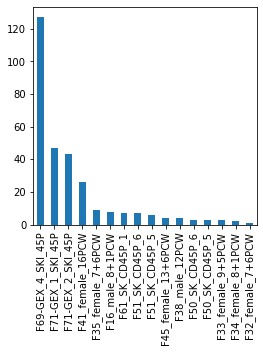

In [73]:
ss.lib.set_figsize((4,4))
ad1_10.obs['sample'].value_counts().plot(kind='bar')

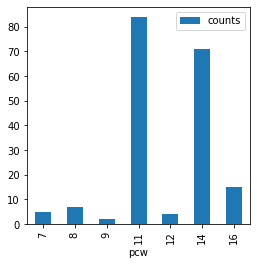

In [91]:
pd.DataFrame(ad1_10.obs.loc[ad1_10.obs.ACTA1_CD14_expressed==3,'pcw'].value_counts()).reset_index().rename(columns={'index':'pcw', 'pcw':'counts'}).sort_values('pcw').set_index('pcw').plot(kind='bar')

In [43]:
ss.lib.simple_default_pipeline(
    ad2,
    filter_params=None, norm_params=None, hvg_params=None, scale_params=None, pca_params=None,
    harmony_params={'batch': 'sample', 'key_added': 'hm'},
    nb_params={'use_rep': 'X_pca_hm', 'key_added': 'hm'},
    umap_params={'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    leiden_params={'resolution': CLUSTER_RESOLUTIONS, 'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

AnnData object with n_obs × n_vars = 39028 × 23447 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'qc_cluster', '__is_in_cluster__', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'leiden_orig_r0_5', 'lr_annot', 'doublet', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'leiden_orig_r0_5_colors', 'lr_annot_colors', 'neighbors_hm', 'neighbors'
    obsm: 'X_pca', 'X_umap

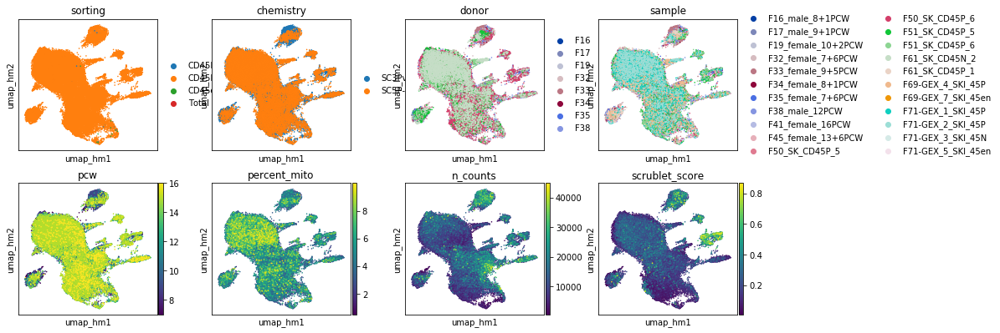

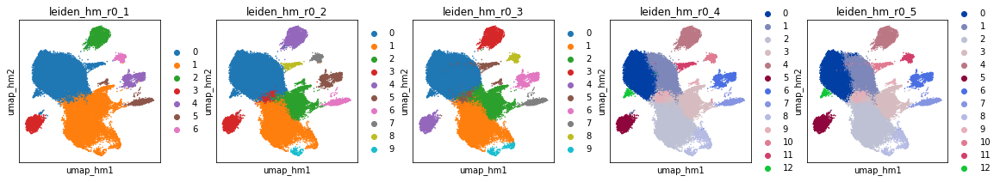

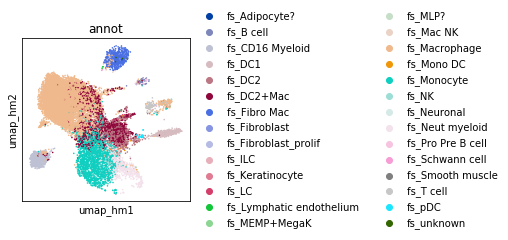

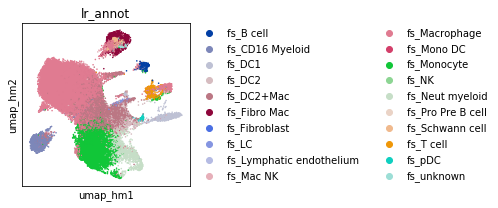

                    freq     p
leiden_hm_r0_1                
0               0.002701  0.75
1               0.012690  0.75
2               0.286686  0.00
3               0.020113  0.75
4               0.654076  0.00
5               0.004796  0.75
6               0.585302  0.00
                   score             p
leiden_hm_r0_1                        
0               0.118115  7.244189e-01
1               0.101904  7.392025e-01
2               0.234764  1.636520e-02
3               0.086087  7.500003e-01
4               0.428381  2.240891e-10
5               0.116039  7.244189e-01
6               0.287433  6.349833e-04


In [44]:
ss.lib.set_figsize((3,3))
plot_scatter(
    ad2, basis='umap_hm', size=10,
    color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'])
plot_scatter(
    ad2, basis='umap_hm', size=10, ncols=len(CLUSTER_RESOLUTIONS),
    color=[f'leiden_hm_r{str(res).replace(".", "_")}' for res in CLUSTER_RESOLUTIONS])
plot_scatter(ad2[k_annot, :], basis='umap_hm', size=10, color='annot')
plot_scatter(ad2, basis='umap_hm', size=10, color='lr_annot')


doublet_freq = ad2.obs.groupby('leiden_hm_r0_1')['doublet'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

doublet_freq = ad2.obs.groupby('leiden_hm_r0_1')['scrublet_score'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

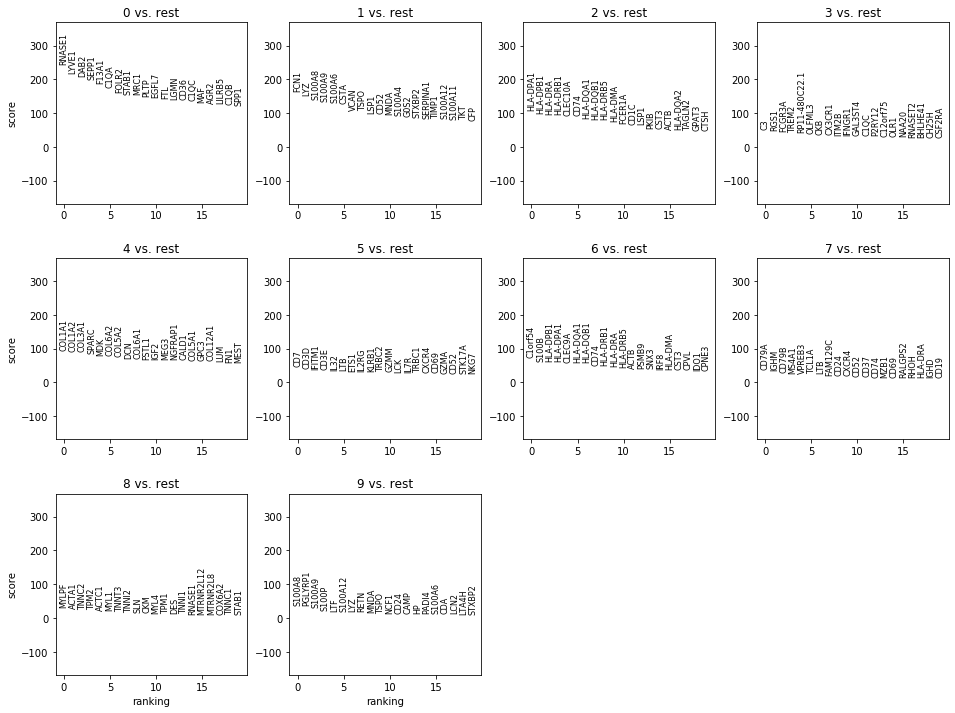

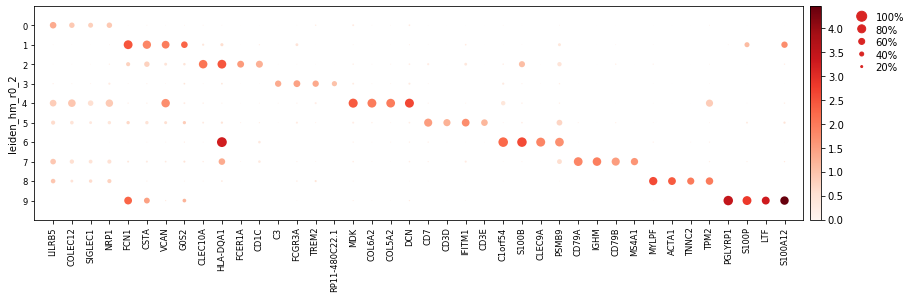

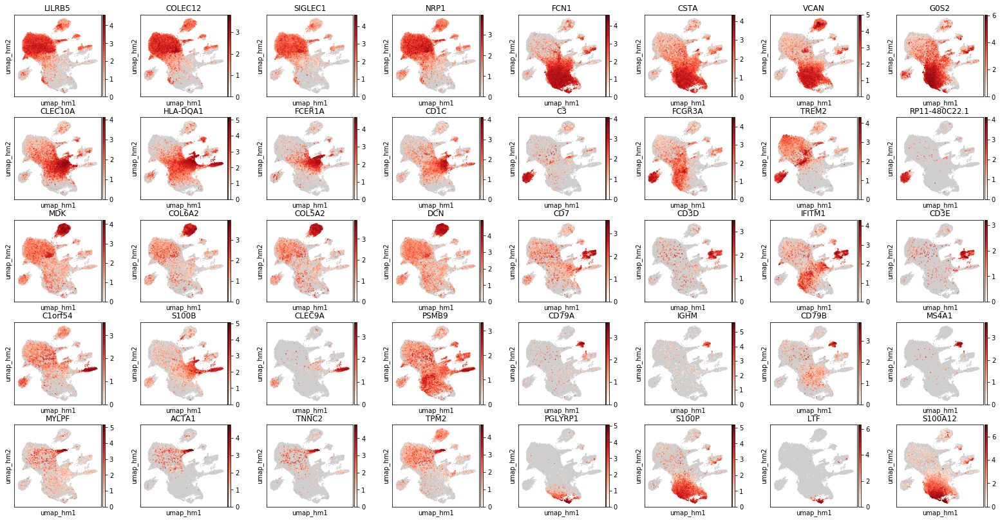

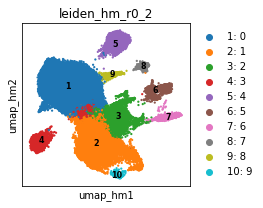

In [45]:
DE_RES = 0.2

hm_de_genes2 = diffexp(
    ad2, basis='umap', key='hm', res=DE_RES, method=DE_METHOD,
    filter_params=DE_FILTERS,
    extra_genes=KNOWN_MARKERS
)
hm_de_genes2.groupby('cluster').head(5)

res = str(DE_RES).replace(".", "_")
# hm_de_genes2.groupby('cluster').head(30).to_csv(
#     f'2.{CATEGORY_CLUSTER_ID+1}_{CATEGORY_NAME}_harmony_noCC_leiden_r{res}_DE_filtered_top30.txt', sep='\t', index=False)
# ss.lib.extract_de_table(ad2.uns[f'rank_genes_groups_hm_r{res}']).groupby('cluster').head(200).to_csv(
#     f'2.{CATEGORY_CLUSTER_ID+1}_{CATEGORY_NAME}_harmony_noCC_leiden_r{res}_DE_top200.txt', sep='\t', index=False)

# 4.2 BBKNN

In [15]:
ad1.uns['neighbors'] = ad1.uns['neighbors_orig']
bbknn.bbknn(ad1, batch_key='sample', metric='angular', neighbors_within_batch=2, trim=None, copy=False)
ad1.uns['neighbors_bk'] = ad1.uns['neighbors']
ss.lib.umap(ad1, use_graph='neighbors_bk', key_added='bk')
ss.lib.leiden(ad1, use_graph='neighbors_bk', key_added='bk', resolution=CLUSTER_RESOLUTIONS)

['leiden_bk_r0_1',
 'leiden_bk_r0_2',
 'leiden_bk_r0_3',
 'leiden_bk_r0_4',
 'leiden_bk_r0_5']

In [38]:
k_annot = (ad1.obs['annot'] != 'nan').values

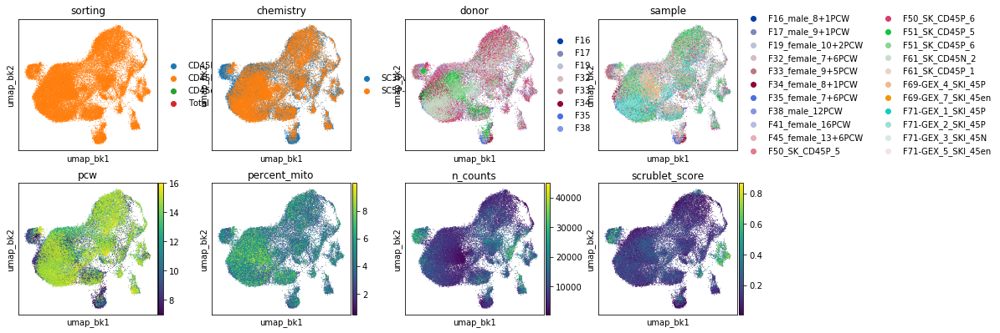

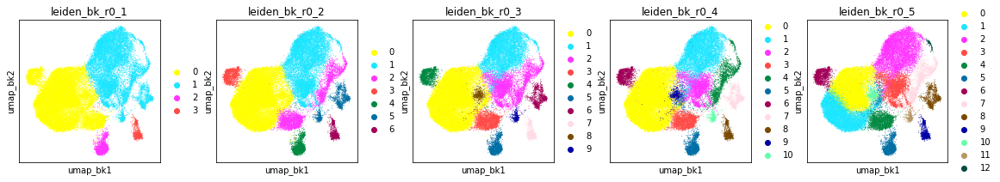

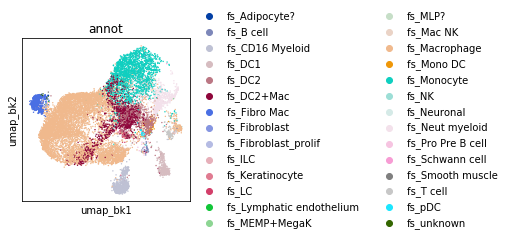

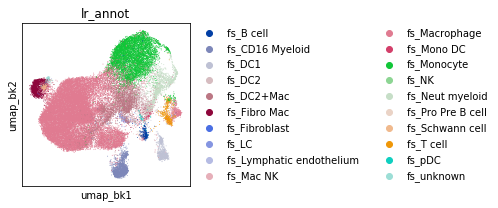

In [40]:
ss.lib.set_figsize((3,3))
plot_scatter(
    ad1, basis='umap_bk',
    color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'])
plot_scatter(
    ad1, basis='umap_bk', ncols=len(CLUSTER_RESOLUTIONS),
    color=[f'leiden_bk_r{str(res).replace(".", "_")}' for res in CLUSTER_RESOLUTIONS])
plot_scatter(ad1[k_annot, :], basis='umap_bk', color='annot')
plot_scatter(ad1, basis='umap_bk', color='lr_annot')

In [47]:
ad1.obs['doublet'] = ad1.obs['bh_doublet_pval'] < 0.05

In [48]:
doublet_freq = ad1.obs.groupby('leiden_bk_r0_4')['doublet'].agg(lambda x: sum(x)/len(x))
p, p_adj = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

doublet_freq = ad1.obs.groupby('leiden_bk_r0_4')['scrublet_score'].agg(lambda x: sum(x)/len(x))
p, p_adj = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

                    freq         p
leiden_bk_r0_4                    
0               0.002511  0.637987
1               0.020554  0.025230
2               0.004392  0.544720
3               0.004288  0.550004
4               0.001079  0.704143
5               0.016511  0.075128
6               0.289971  0.000000
7               0.663959  0.000000
8               0.005270  0.500000
9               0.000000  0.750000
10              0.625360  0.000000
                   score             p
leiden_bk_r0_4                        
0               0.114359  5.813274e-01
1               0.092794  7.770104e-01
2               0.122309  5.000000e-01
3               0.128406  4.374584e-01
4               0.119923  5.245668e-01
5               0.096188  7.500003e-01
6               0.233173  2.100555e-03
7               0.431657  6.661338e-16
8               0.108363  6.406159e-01
9               0.157767  1.799447e-01
10              0.295600  3.827512e-06


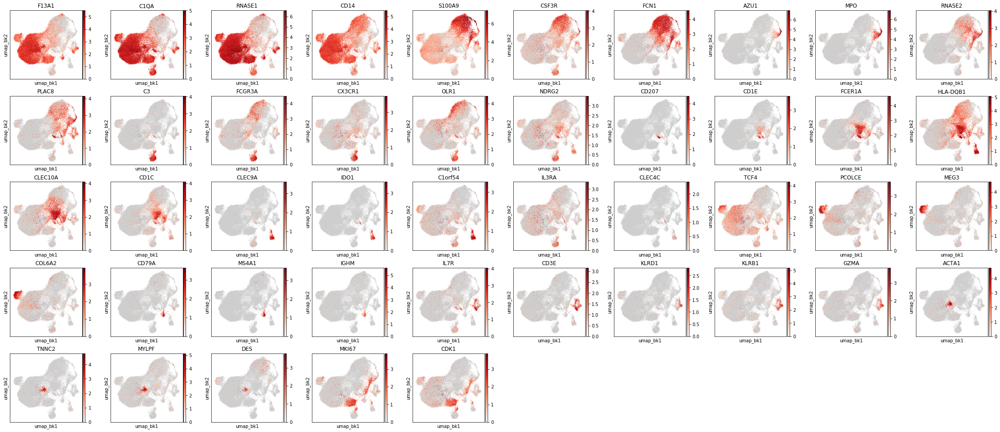

In [50]:
ss.lib.set_figsize((3,3))
plot_scatter(ad1, basis='umap_bk', color_map=expr_cmap, ncols=10, color=rachel_markers)

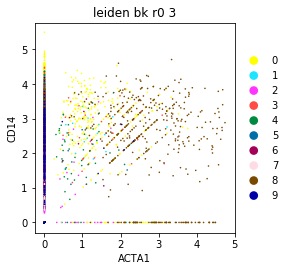

In [52]:
sc.pl.scatter(ad1, x='ACTA1', y='CD14', color='leiden_bk_r0_3', size=10)

,cluster,ref,rank,genes,scores,logfoldchanges,pvals,pvals_adj
32,0,rest,32,SIGLEC1,83.296074,2.590544,0.000000e+00,0.000000e+00
40,0,rest,40,CD28,75.978752,2.570161,0.000000e+00,0.000000e+00
53,0,rest,53,TIMD4,67.699020,2.384831,0.000000e+00,0.000000e+00
24009,1,rest,0,FCN1,152.643524,5.381473,0.000000e+00,0.000000e+00
24014,1,rest,5,CSTA,112.962212,4.162754,0.000000e+00,0.000000e+00
24015,1,rest,6,VCAN,103.051056,4.345967,0.000000e+00,0.000000e+00
24018,1,rest,9,G0S2,97.323349,5.371820,0.000000e+00,0.000000e+00
24021,1,rest,12,SERPINA1,90.505852,4.823186,0.000000e+00,0.000000e+00
48023,2,rest,5,HLA-DQA1,89.742828,4.980232,0.000000e+00,0.000000e+00
48025,2,rest,7,CLEC10A,86.376915,4.884602,0.000000e+00,0.000000e+00


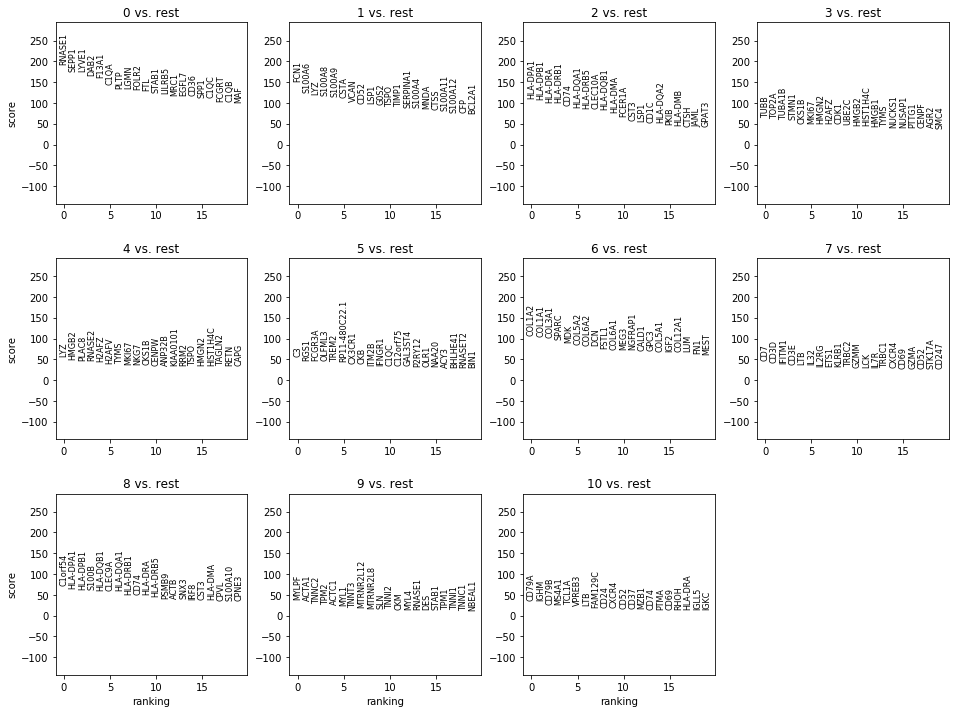

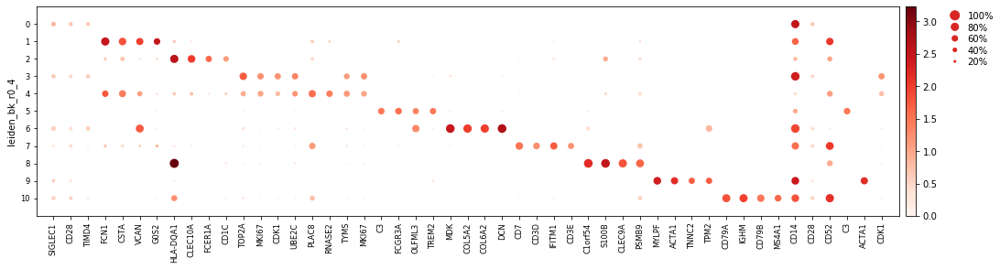

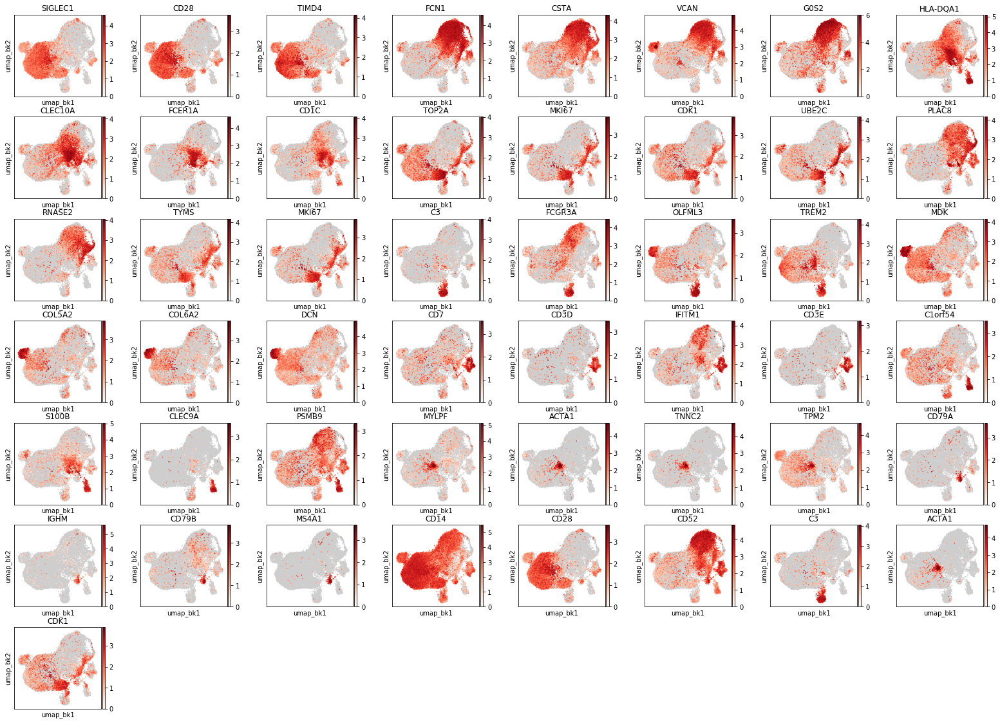

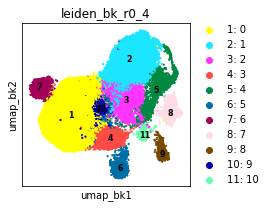

In [110]:
DE_RES = 0.4

bk_de_genes1 = diffexp(
    ad1, basis='umap', key='bk', res=DE_RES, method=DE_METHOD,
    filter_params=DE_FILTERS,
    extra_genes=KNOWN_MARKERS + ['CDK1']
)
bk_de_genes1.groupby('cluster').head(5)

In [101]:
ad2.uns['neighbors'] = ad2.uns['neighbors_orig']
bbknn.bbknn(ad2, batch_key='sample', metric='euclidean', neighbors_within_batch=2, trim=None, copy=False)
ad2.uns['neighbors_bk'] = ad2.uns['neighbors']
ss.lib.umap(ad2, use_graph='neighbors_bk', key_added='bk')
ss.lib.leiden(ad2, use_graph='neighbors_bk', key_added='bk', resolution=CLUSTER_RESOLUTIONS)

['leiden_bk_r0_1',
 'leiden_bk_r0_2',
 'leiden_bk_r0_3',
 'leiden_bk_r0_4',
 'leiden_bk_r0_5']

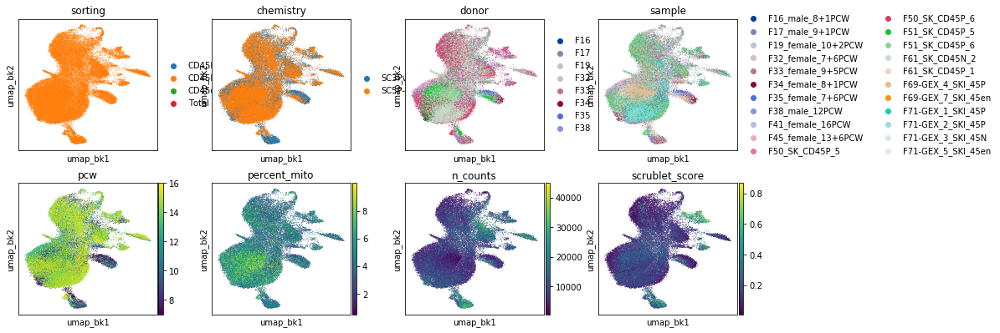

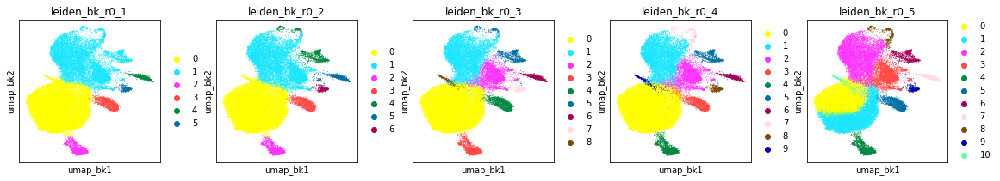

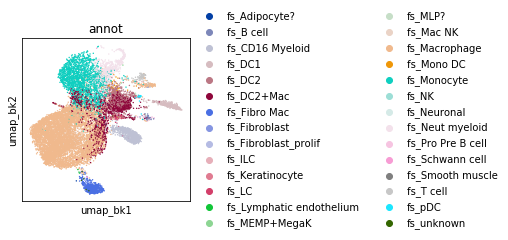

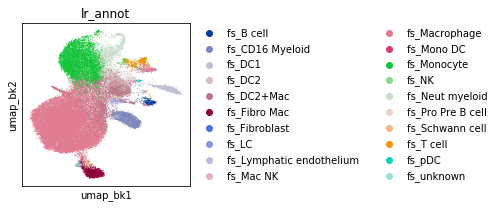

In [102]:
ss.lib.set_figsize((3,3))
plot_scatter(
    ad2, basis='umap_bk',
    color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'])
plot_scatter(
    ad2, basis='umap_bk', ncols=len(CLUSTER_RESOLUTIONS),
    color=[f'leiden_bk_r{str(res).replace(".", "_")}' for res in CLUSTER_RESOLUTIONS])
plot_scatter(ad2[k_annot, :], basis='umap_bk', color='annot')
plot_scatter(ad2, basis='umap_bk', color='lr_annot')

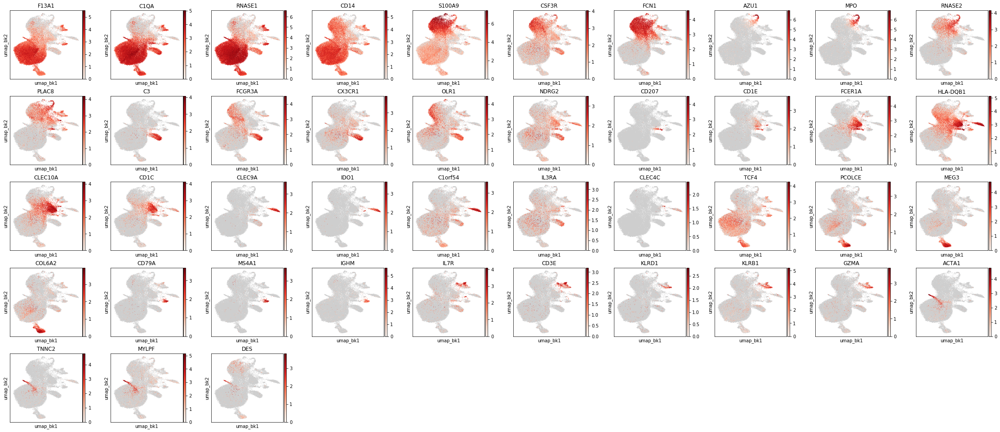

In [104]:
ss.lib.set_figsize((3,3))
plot_scatter(ad2, basis='umap_bk', color_map=expr_cmap, ncols=10, color=rachel_markers[0:-2])

In [105]:
ad2.obs['doublet'] = ad2.obs['bh_doublet_pval'] < 0.05

In [106]:
doublet_freq = ad2.obs.groupby('leiden_bk_r0_4')['doublet'].agg(lambda x: sum(x)/len(x))
p, p_adj = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

doublet_freq = ad2.obs.groupby('leiden_bk_r0_4')['scrublet_score'].agg(lambda x: sum(x)/len(x))
p, p_adj = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

                    freq         p
leiden_bk_r0_4                    
0               0.002994  0.715852
1               0.017254  0.337434
2               0.005105  0.664221
3               0.017026  0.343237
4               0.311887  0.000000
5               0.684100  0.000000
6               0.005398  0.656763
7               0.000000  0.781839
8               0.616715  0.000000
9               0.000000  0.781839
                   score             p
leiden_bk_r0_4                        
0               0.118394  5.173589e-01
1               0.093261  7.912647e-01
2               0.121246  4.826411e-01
3               0.093273  7.911535e-01
4               0.242077  9.484773e-05
5               0.437722  0.000000e+00
6               0.106174  6.615064e-01
7               0.113683  5.743069e-01
8               0.293963  5.292855e-08
9               0.137461  2.950982e-01


,cluster,ref,rank,genes,scores,logfoldchanges,pvals,pvals_adj
16,0,rest,16,LILRB5,137.823700,3.667860,0.000000e+00,0.000000e+00
33,0,rest,33,COLEC12,102.745804,2.891096,0.000000e+00,0.000000e+00
35,0,rest,35,SIGLEC1,101.512375,3.197350,0.000000e+00,0.000000e+00
38,0,rest,38,NRP1,96.716721,2.616629,0.000000e+00,0.000000e+00
40,0,rest,40,BLVRA,94.095230,2.569595,0.000000e+00,0.000000e+00
23447,1,rest,0,FCN1,174.136414,5.879895,0.000000e+00,0.000000e+00
23452,1,rest,5,CSTA,127.359612,4.468421,0.000000e+00,0.000000e+00
23453,1,rest,6,VCAN,111.914459,4.544403,0.000000e+00,0.000000e+00
23459,1,rest,12,G0S2,92.163826,5.075913,0.000000e+00,0.000000e+00
23461,1,rest,14,SERPINA1,88.552223,4.736042,0.000000e+00,0.000000e+00


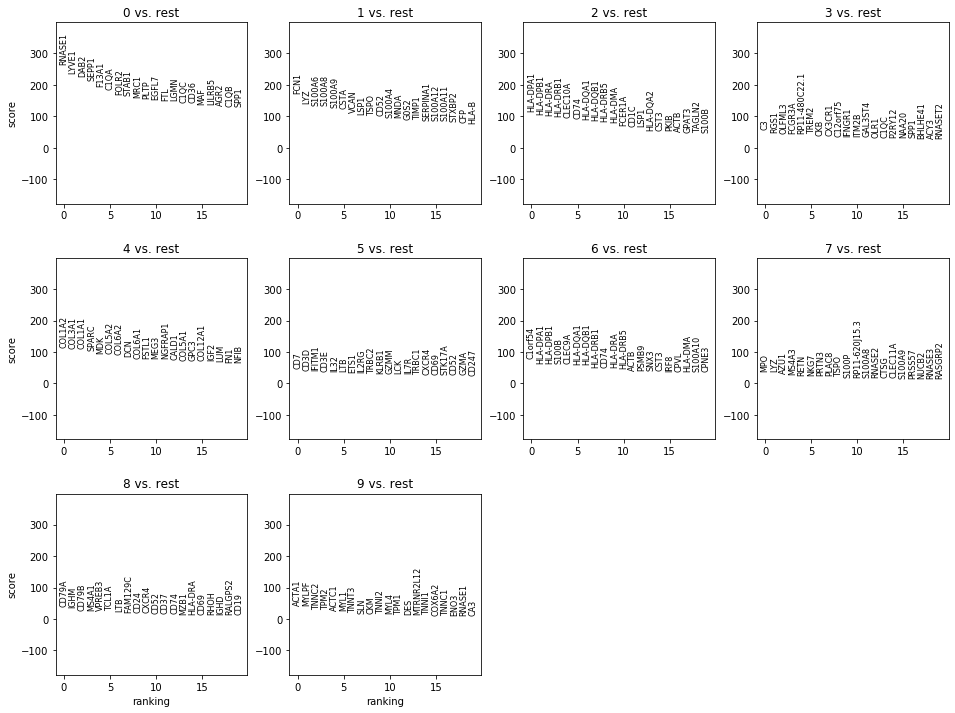

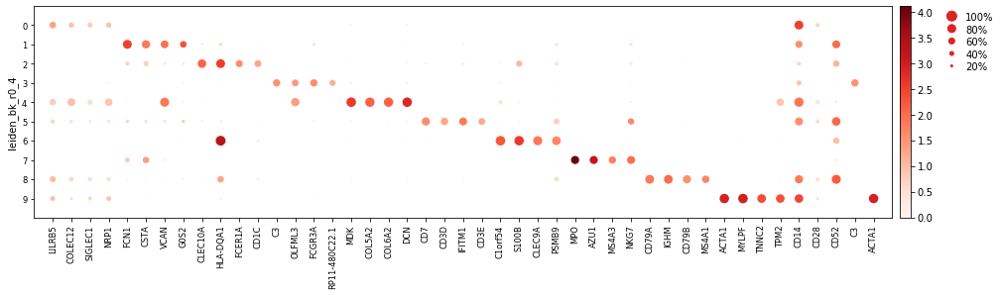

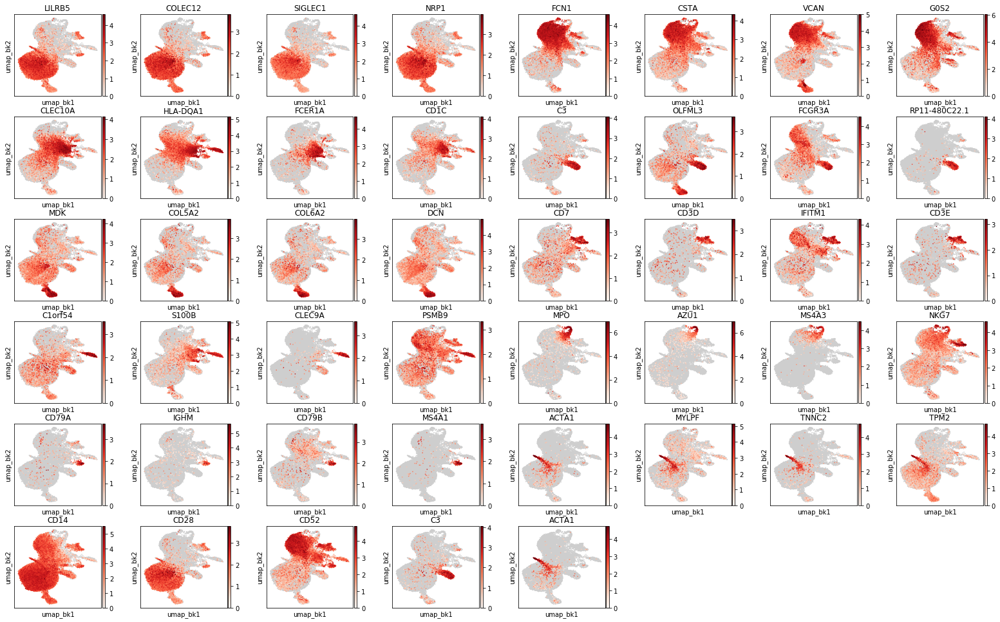

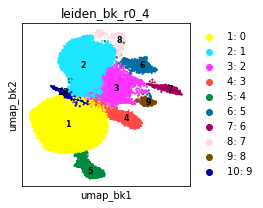

In [111]:
DE_RES = 0.4

bk_de_genes2 = diffexp(
    ad2, basis='umap', key='bk', res=DE_RES, method=DE_METHOD,
    filter_params=DE_FILTERS,
    extra_genes=KNOWN_MARKERS
)
bk_de_genes2.groupby('cluster').head(5)

# 5. Combine clustering and embeddings

In [62]:
ad1.obsm['X_umap_hm_nocc'] = ad2.obsm['X_umap_hm']
ad1.obsm['X_umap_bk_nocc'] = ad2.obsm['X_umap_bk']
for res in CLUSTER_RESOLUTIONS:
    r = str(res).replace(".", "_")
    ad1.obs[f'leiden_hm_nocc_r{r}'] = ad2.obs[f'leiden_hm_r{r}']
    ad1.obs[f'leiden_bk_nocc_r{r}'] = ad2.obs[f'leiden_bk_r{r}']

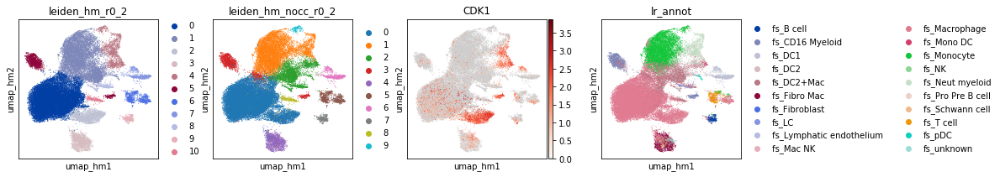

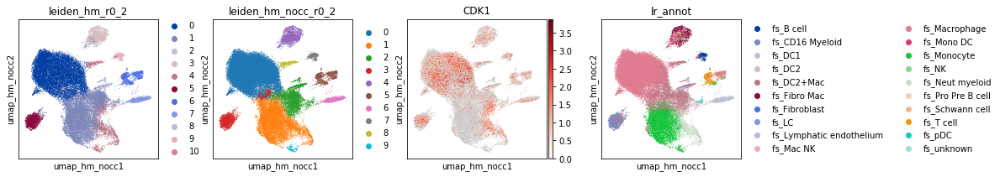

In [64]:
ss.lib.set_figsize((3,3))
plot_scatter(ad1, basis='umap_hm', color_map=expr_cmap,
             color=['leiden_hm_r0_2', 'leiden_hm_nocc_r0_2', 'CDK1', 'lr_annot'])
plot_scatter(ad1, basis='umap_hm_nocc', color_map=expr_cmap,
             color=['leiden_hm_r0_2', 'leiden_hm_nocc_r0_2', 'CDK1', 'lr_annot'])

In [16]:
ad1.write(f'data/h5ad/fetal_skin_hierarch1_{CATEGORY_NAME}_processed.h5ad', compression='lzf')
# ad2.write(f'data/h5ad/fetal_skin_hierarch1_{CATEGORY_NAME}_processed_nocc.h5ad', compression='lzf')

In [100]:
ad1 = sc.read(f'data/h5ad/fetal_skin_hierarch1_{CATEGORY_NAME}_processed.h5ad')
ad2 = sc.read(f'data/h5ad/fetal_skin_hierarch1_{CATEGORY_NAME}_processed_nocc.h5ad')